<h1>This notebook will be used for all the EDA of our cleaned databases.</h1>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import shapiro
from scipy.special import boxcox1p
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
# Bases de datos iniciales.

mdm = pd.read_csv("../data/mdm_clean.csv")
comp_dim = pd.read_csv("../data/comp_dim_clean.csv")
investments = pd.read_csv("../data/mintic_investments_clean.csv")

In [3]:
# Configuración del display de pandas y seaborn.

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
sns.set_style('darkgrid')

In [4]:
# Estandarización en los nombres de las columnas de las tres bases.

name_cols = {'codigo': 'codigo_municipio',
             'departame_nombre': 'departamento',
             'departame_cod': 'codigo_departamento',
             'municipio_nombre': 'municipio',
             'municipio_cod': 'codigo_municipio'}

mdm.rename(name_cols, axis = 1, inplace = True)
comp_dim.rename(name_cols, axis = 1, inplace = True)
investments.rename(name_cols, axis = 1, inplace = True)

In [5]:
# Debido a que la base de `investments` tiene una mayor cantidad de municipios comparado a las otras dos, se genera una lista
# con los municipios en común.

mun_mdm = mdm.codigo_municipio.unique()
mun_inv = investments.codigo_municipio.unique()
mun_common = set(mun_mdm).intersection(mun_inv)

# Adicionalmente se seleccionan los años para los que se tiene información de la base de `mdm` (que es igual a los de `comp_dim`).

anio_mdm = mdm.anio_corte.unique()

In [6]:
# Se realiza el primer merge entre `mdm` y `comp_dim`.

merge1 = comp_dim.merge(mdm, on = ['anio_corte', 'codigo_municipio'],
                        suffixes = ['', '_del'])

# Adicionalmente se filtran las columnas repetidas (aquellas que tienen en su nombre la etiqueta '_del') y se eliminan del merge.

to_del = merge1.columns[merge1.columns.str.contains('_del')]
merge1.drop(to_del, axis = 1, inplace = True)

In [7]:
# Se genera un subgrupo de `investments` donde se toman los municipios y años seleccionados en la celda anterior.

investments_clean = investments.loc[investments.codigo_municipio.isin(mun_common)
                                    & investments.anio_corte.isin(anio_mdm)]

In [8]:
# Se guardan los valores de 'inversion' en dos columnas nuevas, según el viceministerio al que pertenecen.

investments_clean['inversion_conectividad'] = investments_clean.inversion
investments_clean['inversion_transformacion'] = investments_clean.inversion

investments_clean.loc[investments_clean['viceministerio'] == 'transformacion', 'inversion_conectividad'] = 0
investments_clean.loc[investments_clean['viceministerio'] == 'conectividad', 'inversion_transformacion'] = 0

<ipython-input-8-fe9d5f094d2f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  investments_clean['inversion_conectividad'] = investments_clean.inversion
<ipython-input-8-fe9d5f094d2f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  investments_clean['inversion_transformacion'] = investments_clean.inversion
/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

In [9]:
# Se agrupan los valores por municipio y año de corte y se suman las columnas de inversiones.

investments_clean = investments_clean.groupby(['anio_corte', 'codigo_municipio', 'codigo_departamento']).sum().reset_index()

In [10]:
# Se realiza un segundo merge con la tabla `investments_clean`

merge2 = merge1.merge(investments_clean, 
                      on = ['anio_corte', 'codigo_municipio'],
                      suffixes = ['', '_del'])

# Adicionalmente se filtran las columnas repetidas (aquellas que tienen en su nombre la etiqueta '_del') y se eliminan del merge.

to_del = merge2.columns[merge2.columns.str.contains('_del')]
merge2.drop(to_del, axis = 1, inplace = True)

In [11]:
# Se definen varias columnas adicionales a eliminar y se remueven del dataframe `merge2`

cols_to_drop = ['puesto_mdm_grupo_dotaciones', 'id', 'puesto_mdm_nacional', 'beneficiarios']
df_merged = merge2.drop(cols_to_drop, axis = 1)

In [12]:
# Se definen las columnas 'anio_corte' y 'codigo_municipio' como categórica.

df_merged.anio_corte = df_merged.anio_corte.astype('category')
df_merged.codigo_municipio  = df_merged.codigo_municipio .astype('category')

In [13]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4404 entries, 0 to 4403
Data columns (total 28 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   anio_corte                           4404 non-null   category
 1   municipio                            4404 non-null   object  
 2   codigo_municipio                     4404 non-null   category
 3   departamento                         4404 non-null   object  
 4   grupo_dotaciones                     4404 non-null   object  
 5   categoria_de_ruralidad               4404 non-null   object  
 6   cobertura_media_neta                 4404 non-null   float64 
 7   saber_11_matematicas                 4404 non-null   float64 
 8   saber_11_lenguaje                    4404 non-null   float64 
 9   cobertura_transicion                 4404 non-null   float64 
 10  cobertura_salud                      4404 non-null   float64 
 11  vacunacion_pentav

In [14]:
# Se genera la tabla de correlaciones.

corr = df_merged.corr()

<AxesSubplot:>

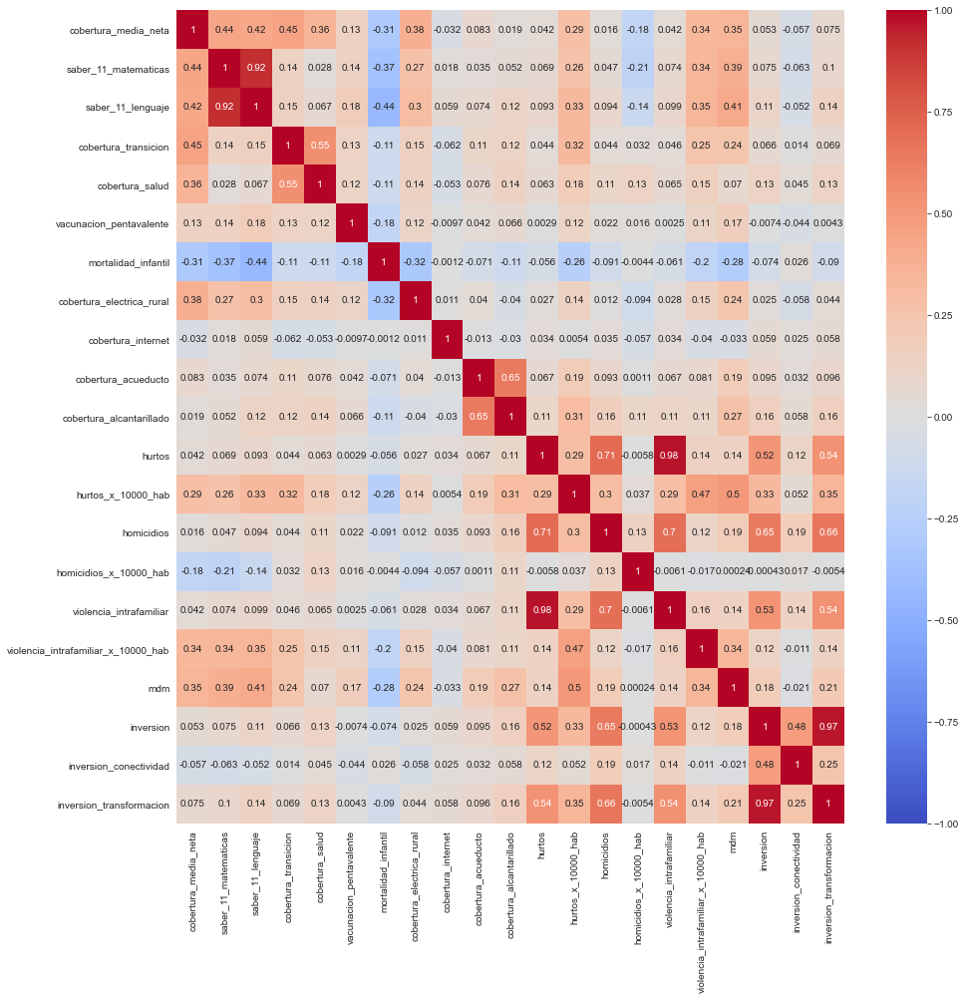

In [15]:
# Se genera un mapa de calor con la tabla de correlaciones anterior.

fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(corr, annot = True, cmap = 'coolwarm', vmin = -1, vmax = 1)

In [16]:
# Se extraen las columnas de tipo numérico para generar poder generar varias gráficas por medio de un ciclo en la próxima celda.

numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = df_merged.select_dtypes(include=numerics).columns
num_cols

Index(['cobertura_media_neta', 'saber_11_matematicas', 'saber_11_lenguaje',
       'cobertura_transicion', 'cobertura_salud', 'vacunacion_pentavalente',
       'mortalidad_infantil', 'cobertura_electrica_rural',
       'cobertura_internet', 'cobertura_acueducto', 'cobertura_alcantarillado',
       'hurtos', 'hurtos_x_10000_hab', 'homicidios', 'homicidios_x_10000_hab',
       'violencia_intrafamiliar', 'violencia_intrafamiliar_x_10000_hab', 'mdm',
       'inversion', 'inversion_conectividad', 'inversion_transformacion'],
      dtype='object')

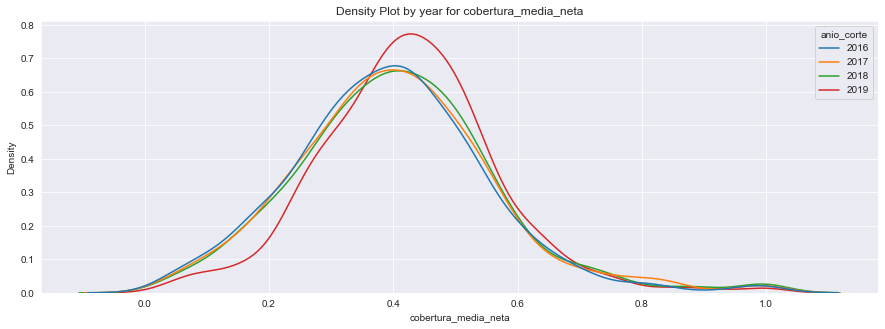

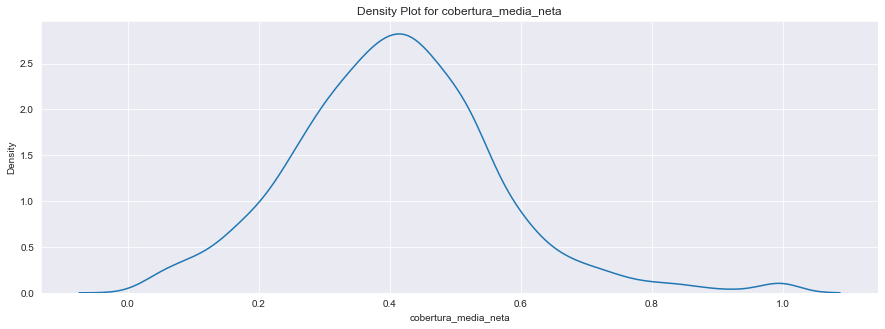

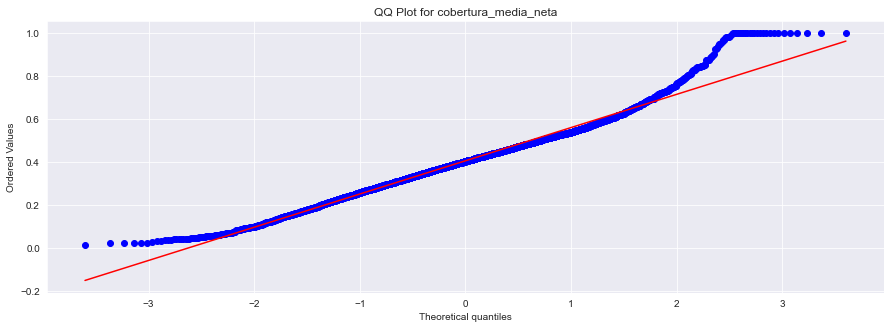

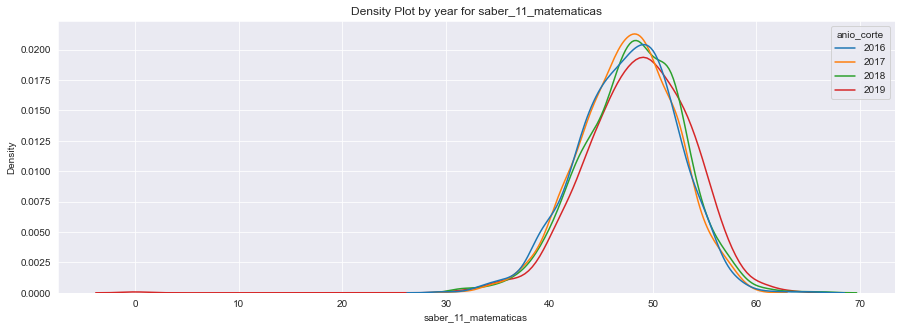

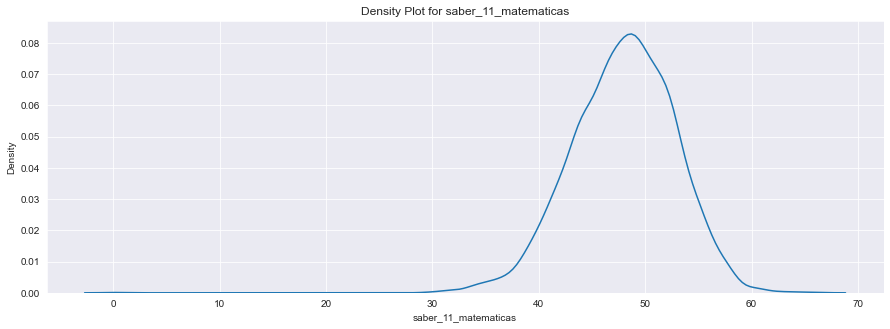

...

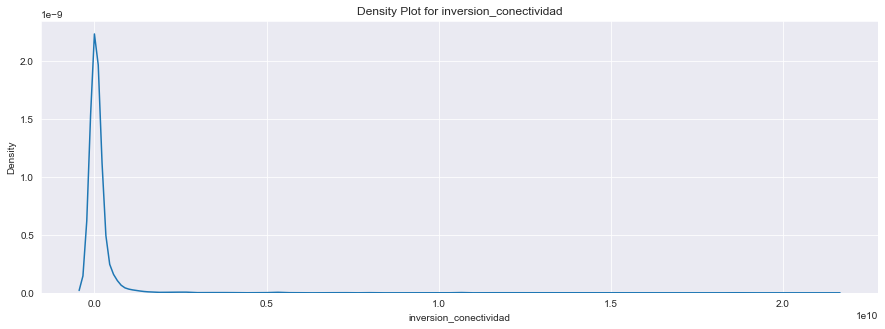

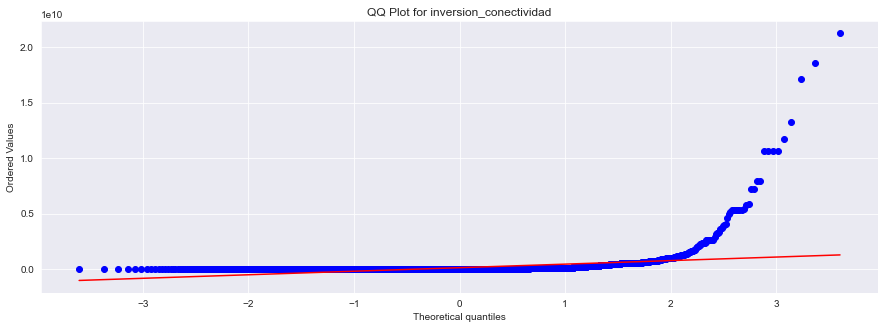

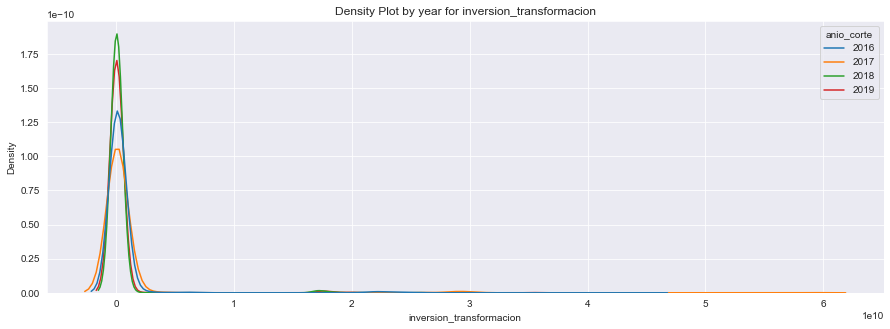

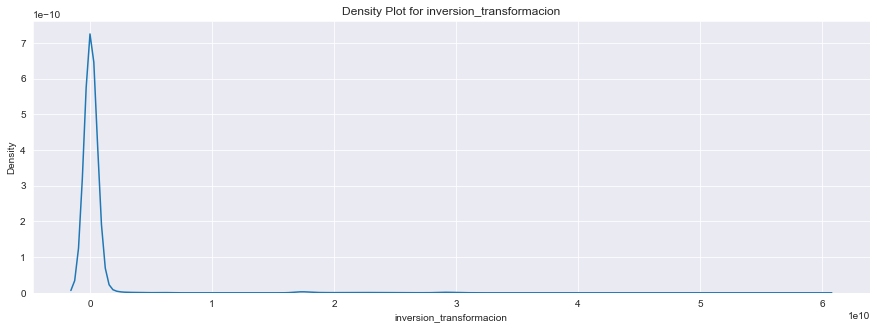

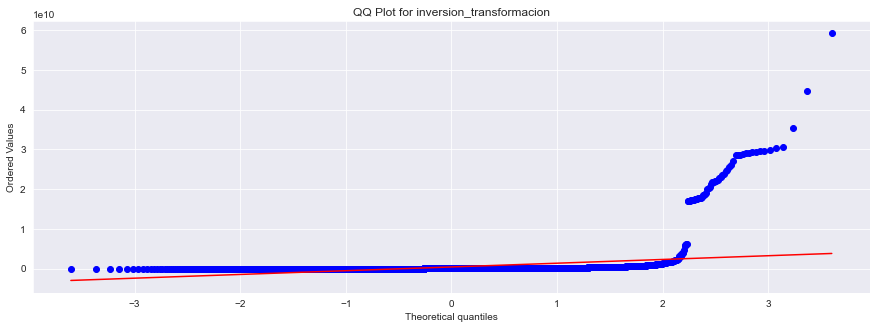

In [17]:
# Para cada una de las columnas de la celda anterior:

for col in num_cols:
    
    # Se genera un gráfico de densidad discriminando por año por año.
    
    fig, ax = plt.subplots(figsize=(15, 5))
    sns.kdeplot(x = col, hue = 'anio_corte', data = df_merged)
    plt.title(f'Density Plot by year for {col}')
    plt.show()
    
    # Se genera un gráfico de densidad con los datos sin discriminar.
    
    fig, ax = plt.subplots(figsize=(15, 5))
    sns.kdeplot(x = col, data = df_merged)
    plt.title(f'Density Plot for {col}')
    plt.show()
    
    # Se genera un QQ Plot para revisar normalidad.
    
    fig, ax = plt.subplots(figsize=(15, 5))
    stats.probplot(x = df_merged[col], dist="norm", plot = plt)
    plt.title(f'QQ Plot for {col}')
    plt.show()

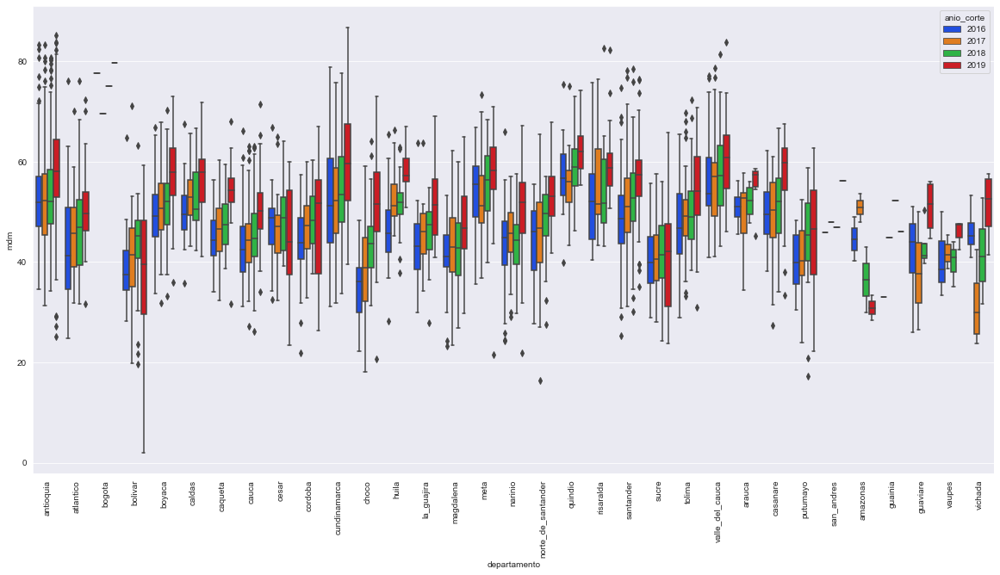

In [18]:
# Se genera un boxplot de la columna 'departamento' contra 'mdm', discriminada por año.

fig, ax = plt.subplots(figsize=(20, 10))
chart = sns.boxplot(y = 'mdm', x = 'departamento', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

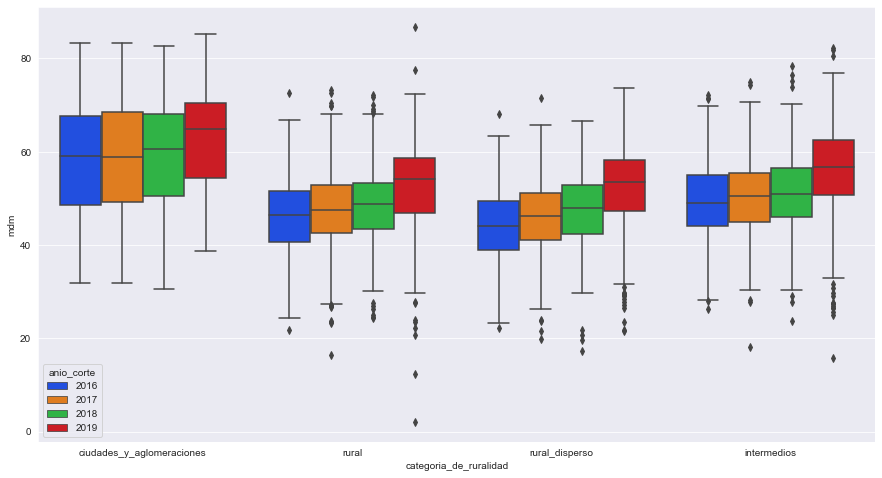

In [19]:
# Se genera un boxplot de la columna 'categoria_de_ruralidad' contra 'mdm', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'mdm', x = 'categoria_de_ruralidad', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=0)
plt.show()

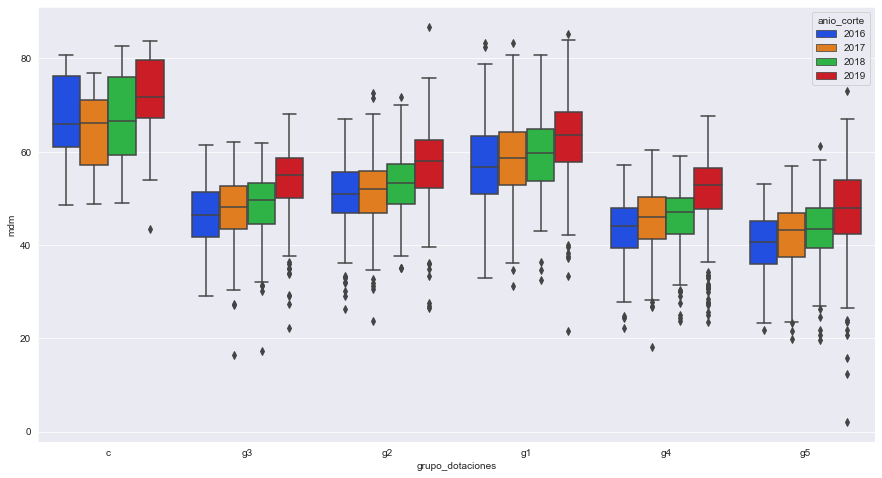

In [20]:
# Se genera un boxplot de la columna 'grupo_dotaciones' contra 'mdm', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'mdm', x = 'grupo_dotaciones', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=0)
plt.show()

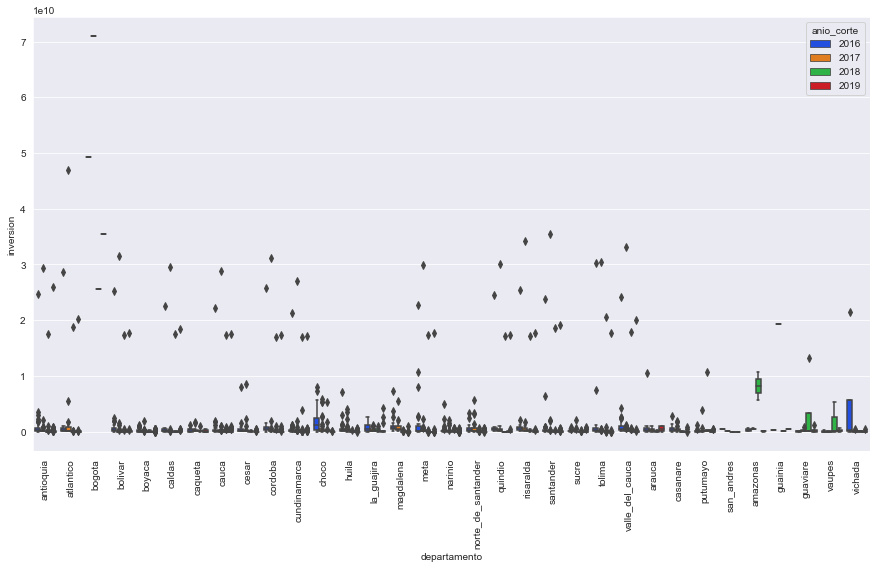

In [21]:
# Se genera un boxplot de la columna 'departamento' contra 'inversion', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'inversion', x = 'departamento', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

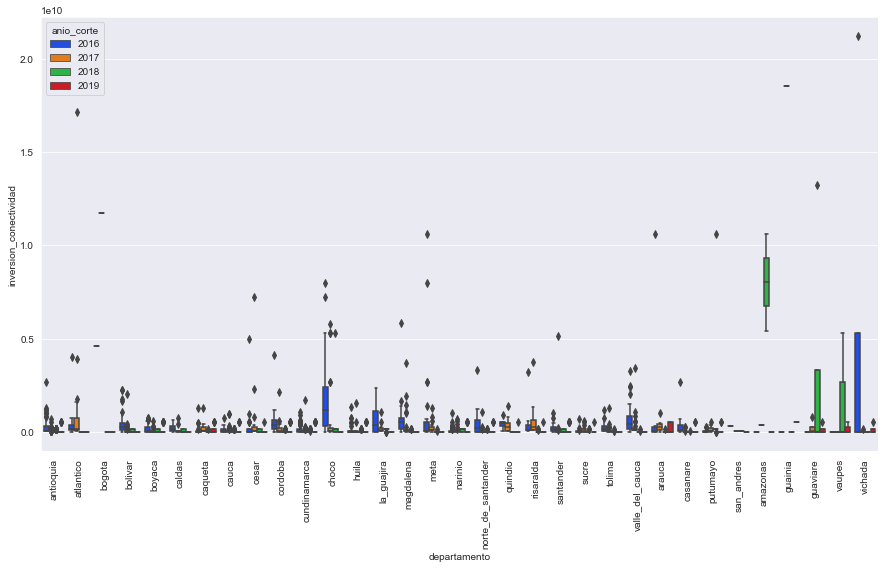

In [22]:
# Se genera un boxplot de la columna 'departamento' contra 'inversion_conectividad', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'inversion_conectividad', x = 'departamento', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

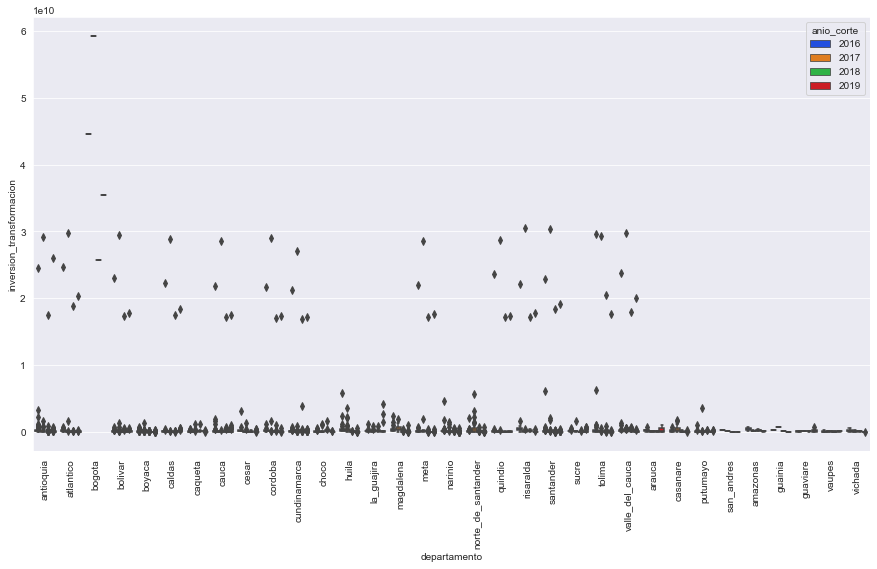

In [23]:
# Se genera un boxplot de la columna 'departamento' contra 'inversion_transformacion', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'inversion_transformacion', x = 'departamento', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

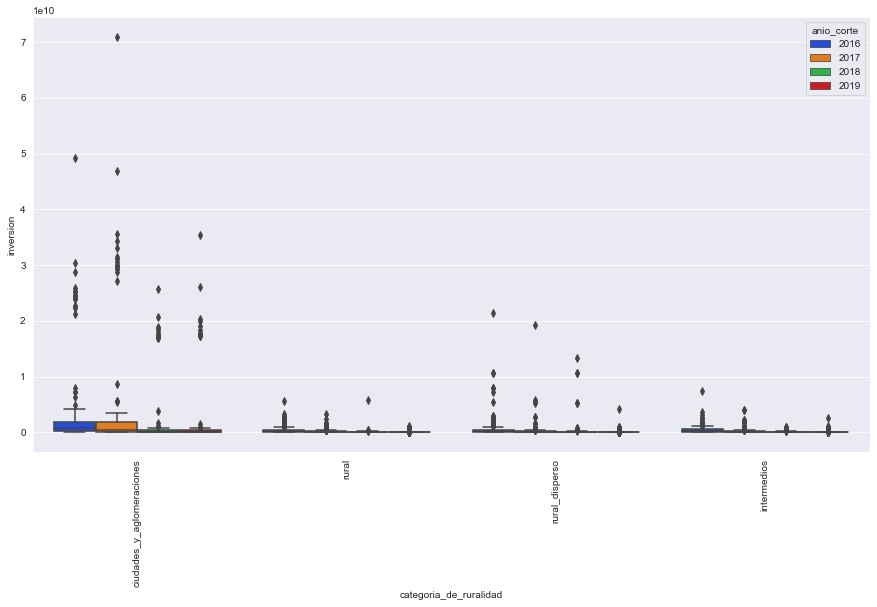

In [24]:
# Se genera un boxplot de la columna 'categoria_de_ruralidad' contra 'inversion', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'inversion', x = 'categoria_de_ruralidad', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

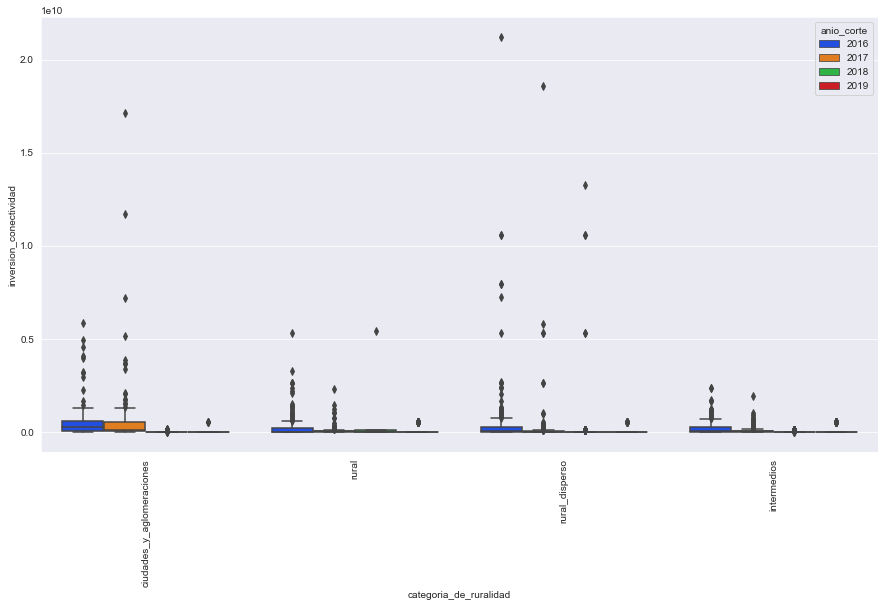

In [25]:
# Se genera un boxplot de la columna 'categoria_de_ruralidad' contra 'inversion_conectividad', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'inversion_conectividad', x = 'categoria_de_ruralidad', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

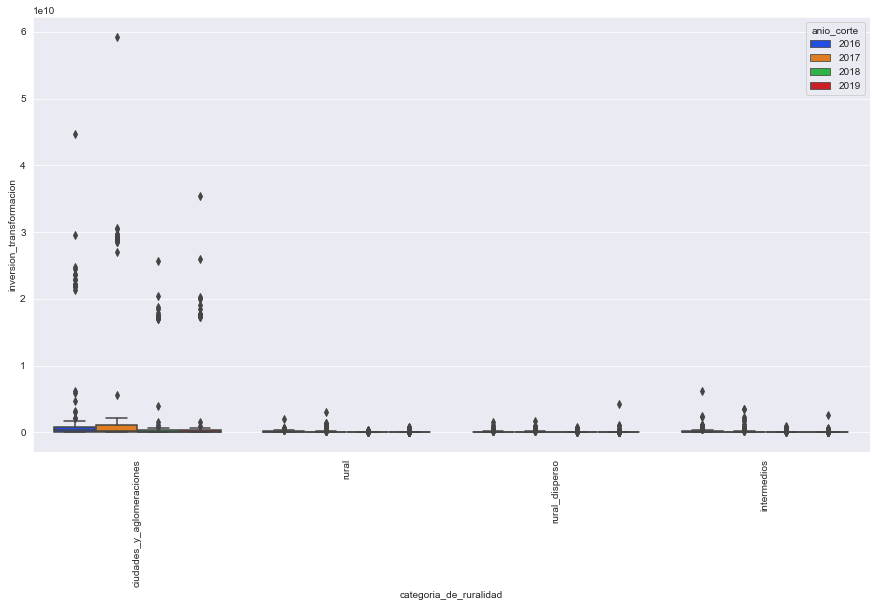

In [26]:
# Se genera un boxplot de la columna 'categoria_de_ruralidad' contra 'inversion_transformacion', discriminada por año.

fig, ax = plt.subplots(figsize=(15, 8))
chart = sns.boxplot(y = 'inversion_transformacion', x = 'categoria_de_ruralidad', ax = ax, hue = 'anio_corte', palette = 'bright', data = df_merged)
chart.set_xticklabels(chart.get_xticklabels(), rotation=90)
plt.show()

In [28]:
vac_pent_0_1 = []
for i in range(len(df_merged)):
    if df_merged['vacunacion_pentavalente'].loc[i]<=1:
        vac_pent_0_1.append(df_merged['vacunacion_pentavalente'].loc[i])
    else:
        vac_pent_year_mean = df_merged[df_merged['anio_corte']==df_merged['anio_corte'].loc[i]]['vacunacion_pentavalente'].mean()
        vac_pent_0_1.append(vac_pent_year_mean)

df_merged['vacunacion_pentavalente_0_1'] = vac_pent_0_1

In [31]:
df_merged_final_vars = df_merged.copy().drop(columns=['hurtos','homicidios','violencia_intrafamiliar','vacunacion_pentavalente'])
df_merged_final_vars.describe()

,cobertura_media_neta,saber_11_matematicas,saber_11_lenguaje,cobertura_transicion,cobertura_salud,mortalidad_infantil,cobertura_electrica_rural,cobertura_internet,cobertura_acueducto,cobertura_alcantarillado,hurtos_x_10000_hab,homicidios_x_10000_hab,violencia_intrafamiliar_x_10000_hab,mdm,inversion,inversion_conectividad,inversion_transformacion,vacunacion_pentavalente_0_1
count,4404.000000,4404.000000,4404.000000,4404.000000,4404.000000,4404.000000,4398.000000,4404.000000,4404.000000,4404.000000,4404.000000,4404.000000,4404.000000,4404.000000,4.404000e+03,4.404000e+03,4.404000e+03,4404.000000
mean,0.407100,47.950800,49.880186,0.535216,0.808769,18.863228,0.879465,0.101718,0.571314,0.388369,17.872695,2.480690,10.004996,50.372279,5.508837e+08,1.551619e+08,3.957218e+08,0.898493
std,0.156045,4.823078,3.592606,0.164099,0.160228,9.315656,0.188705,0.193781,0.298542,0.281378,21.107681,3.171105,10.011659,10.170328,3.076640e+09,7.940069e+08,2.783304e+09,0.111196
min,0.013100,0.000000,0.000000,0.051000,0.170000,1.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.033311,0.000000e+00,0.000000e+00,0.000000e+00,0.157000
25%,0.307000,44.750000,47.703000,0.423000,0.710000,13.510000,0.860000,0.012000,0.340000,0.160000,4.460000,0.000000,3.110000,43.950000,2.666648e+06,0.000000e+00,1.098302e+06,0.846000
50%,0.404900,48.195500,50.129000,0.532050,0.828000,17.160000,0.960000,0.030000,0.570000,0.340000,10.560000,1.590000,7.270000,50.209631,5.223516e+07,0.000000e+00,1.601459e+07,0.935394
75%,0.497000,51.356250,52.351750,0.637000,0.945000,21.914000,0.990000,0.097250,0.832000,0.580000,22.990000,3.273055,13.545086,56.550113,1.938855e+08,8.635423e+07,8.092817e+07,1.000000
max,1.000000,66.130000,64.130000,1.000000,1.000000,87.910000,1.000000,1.000000,1.000000,1.000000,206.028787,31.630000,116.500000,86.816932,7.094560e+10,2.121944e+10,5.922208e+10,1.000000


In [32]:
features = []
shap_pvals = []
normal = []
lambda_ = []
for feature in df_merged_final_vars.columns:
    if df_merged_final_vars[feature].dtype in ['int64', 'float64']:
        features.append(feature)
        shap_pvals.append(shapiro(df_merged_final_vars[feature])[1])
        if shapiro(df_merged_final_vars[feature])[1] <0.05:
            pos_data = df_merged_final_vars[df_merged_final_vars[feature] > 0][feature]
            transformed_feature, lambda_value = stats.boxcox(pos_data)
            lambda_.append(lambda_value)
            normal.append('No')
        else:
            lambda_.append(np.nan)
            normal.append('Yes')
            
pd.DataFrame({'Feature':features, 'Shapiro p-val': shap_pvals, 'Normal':normal, 'Box-cox lambda':lambda_})

,Feature,Shapiro p-val,Normal,Box-cox lambda
0,cobertura_media_neta,1.105497e-24,No,0.745961
1,saber_11_matematicas,4.002343e-19,No,1.737536
2,saber_11_lenguaje,8.302508e-32,No,2.923077
3,cobertura_transicion,1.946344e-11,No,0.787511
4,cobertura_salud,2.711092e-41,No,2.346551
5,mortalidad_infantil,0.000000e+00,No,0.126041
6,cobertura_electrica_rural,1.000000e+00,Yes,NaN
7,cobertura_internet,0.000000e+00,No,-0.018594
8,cobertura_acueducto,3.461095e-36,No,0.844888
9,cobertura_alcantarillado,1.237750e-37,No,0.436732


In [33]:
for anio in list(df_merged_final_vars['anio_corte'].unique()):
    print(anio, '\n', df_merged_final_vars[df_merged_final_vars['anio_corte']==anio][['inversion','inversion_conectividad','inversion_transformacion']].describe(), '\n')

2016 
           inversion  inversion_conectividad  inversion_transformacion
count  1.101000e+03            1.101000e+03              1.101000e+03
mean   8.108949e+08            3.316325e+08              4.792624e+08
std    3.217754e+09            1.030805e+09              2.876995e+09
min    0.000000e+00            0.000000e+00              0.000000e+00
25%    5.707708e+07            7.413146e+06              1.477064e+07
50%    2.018503e+08            7.198296e+07              5.896593e+07
75%    5.047049e+08            3.166978e+08              1.751469e+08
max    4.924652e+10            2.121944e+10              4.465453e+10 

2017 
           inversion  inversion_conectividad  inversion_transformacion
count  1.101000e+03            1.101000e+03              1.101000e+03
mean   7.070759e+08            1.816513e+08              5.254246e+08
std    4.164038e+09            9.748926e+08              3.619450e+09
min    0.000000e+00            0.000000e+00              0.000000e+00
25% 

In [34]:
df_merged_final_vars.to_csv('../data/df_merged_final_vars.csv', index=False)